In [1]:
%matplotlib inline

import os
import sys
import copy
import json
import random
from glob import glob
from timeit import default_timer as timer

import pandas as pd
import numpy as np
import scipy
import dill
from tqdm import tqdm
import shapely
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.ticker as ticker
import matplotlib.colors as colors
import matplotlib.patheffects as pe

import utility as util
import utility.doc

from environment.data_utils import derivative_of
from collect.utility.trajectron import node_to_df, scene_to_df, scenes_to_df
from collect.generate.label import carla_id_maker
from collect.generate.dataset.trajectron import trajectory_curvature
from collect.generate.map import CachedMapData
from collect.visualize.trajectron import (
    AGENT_COLORS,
    NCOLORS,
    PADDING,
    render_scene,
    render_scene_nodes
)

def get_ego_node(nodes):
    nodes = filter(lambda k: 'VEHICLE/ego' in repr(k), nodes)
    return next(nodes)

def get_scene(s):
    sel_scenes = list(filter(lambda scene : scene.name in [s], eval_scenes))
    print(sel_scenes)
    scene = sel_scenes[0]
    return scene

In [2]:
search_datasets = False
rootdir = ".."
datadir = "*"
# datadir = "out"
glob(f"{rootdir}/{datadir}/*.pkl") if search_datasets else []

[]

In [3]:
dataset_1 = util.AttrDict(
        path='../processed/nuScenes_test_full.pkl',
        name='nuscenes_test',
        has_augments=False)

dataset_2 = util.AttrDict(
        path=f"{ rootdir }/carla_v2_1_dataset/carla_train_v2_1_full.pkl",
        name='carla_train_v2_1',
        has_augments=True)

dataset_3 = util.AttrDict(
        path=f"{ rootdir }/carla_v2_1_dataset/carla_test_v2_1_full.pkl",
        name='carla_test_v2_1',
        has_augments=False)

dataset_4 = util.AttrDict(
        path=f"{ rootdir }/carla_v2_2_dataset/carla_train_v2_2_full.pkl",
        name='carla_train_v2_2',
        has_augments=True)

dataset_5 = util.AttrDict(
        path=f"{ rootdir }/carla_v2_2_dataset/carla_test_v2_2_full.pkl",
        name='carla_test_v2_2',
        has_augments=False)

dataset_6 = util.AttrDict(
        path=f"{ rootdir }/carla_v2_1_1_dataset/carla_train_v2_1_1_full.pkl",
        desc="CARLA synthesized dataset smaller sized",
        name="carla_train_v2_1_1",
        has_augments=True)

dataset_7 = util.AttrDict(
        path=f"{ rootdir }/carla_v3_0_1_dataset/carla_train_v3_0_1_full.pkl",
        name='carla_train_v3_0_1',
        has_augments=True)

dataset_8 = util.AttrDict(
        path=f"{ rootdir }/v3-1_split1_train.pkl",
        name='v3-1',
        desc="CARLA synthesized dataset smaller sized with heading and occlusion fix",
        has_augments=True)

dataset_9 = util.AttrDict(
        path=f"{ rootdir }/carla_v3-1-1_dataset/v3-1-1_split1_train.pkl",
        name='v3-1-1',
        desc="CARLA synthesized dataset smaller sized with heading and occlusion fix",
        has_augments=True)

dataset_10 = util.AttrDict(
        path=f"{ rootdir }/carla_v3-1-1_dataset/v3-1-1_split1_train_modfm.pkl",
        name='v3-1-1 modfm',
        desc="CARLA synthesized dataset smaller sized with heading and occlusion fix",
        has_augments=True)

dataset_11 = util.AttrDict(
        path=f"{ rootdir }/carla_dataset_v3-1-2/v3-1-2_split1_train_modfm.pkl",
        name="v3-1-2",
        desc="CARLA synthesized dataset with heading and occlusion fix",
        has_augments=True)

dataset_12 = util.AttrDict(
        path=f"{ rootdir }/carla_dataset_v3-1-2/v3-1-2_split1_val.pkl",
        name="v3-1-2",
        desc="CARLA synthesized dataset with heading and occlusion fix",
        has_augments=False)

dataset_13 = util.AttrDict(
        path=f"{ rootdir }/carla_dataset_v4-1/v4-1_split1_train.pkl",
        name="v4-1",
        desc="CARLA 0.9.13 synthesized dataset all maps",
        has_augments=False)

dataset_14 = util.AttrDict(
        path=f"{ rootdir }/carla_dataset_v4-3/v4-3_split1_train_modfm.pkl",
        name="v4-1",
        desc="CARLA 0.9.13 synthesized dataset all maps",
        has_augments=True)

dataset = dataset_14
with open(dataset.path, 'rb') as f:
    eval_env = dill.load(f, encoding='latin1')
eval_scenes = eval_env.scenes
print(f"Dataset {dataset.name} contains {len(eval_scenes)} scenes.")

Dataset v4-1 contains 500 scenes.


Inspect scene and nodes

In [4]:
# spill dataset metadata 
scene = eval_scenes[0]
node = scene.nodes[0]
df = scene_to_df(scene)
f = lambda x: [*vars(x).keys()]

print("Environment name:", eval_env.name)
for _, scene in zip(range(10), eval_env.scenes):
    print("Scene name:", scene.name)
print()
    
util.doc.results(
    "Environment keys:", f(eval_env),
    "Scene keys:", f(scene),
    "Node keys:", f(node),
    "Data columns:", [*df.columns]
)

Environment name: Town03
Scene name: Town06/ep017/agent4632/frame00004594
Scene name: Town04/ep006/agent2058/frame00006268
Scene name: Town10HD/ep020/agent5719/frame00000803
Scene name: Town06/ep016/agent4444/frame00004362
Scene name: Town04/ep009/agent2786/frame00009439
Scene name: Town04/ep009/agent2780/frame00009439
Scene name: Town06/ep015/agent4230/frame00003800
Scene name: Town06/ep018/agent4835/frame00005486
Scene name: Town06/ep018/agent4835/frame00005156
Scene name: Town07/ep029/agent5634/frame00003956

Environment keys:
['scenes', 'name', 'node_type_list', 'attention_radius', 'NodeType', 'robot_type', 'standardization', 'standardize_param_memo', '_scenes_resample_prop']

Scene keys:
['ego_initx', 'ego_inity', 'x_min', 'y_min', 'x_max', 'y_max', 'x_size', 'y_size', 'patch_box', 'patch_angle', 'canvas_size', 'homography', 'layer_names', 'map', 'timesteps', 'dt', 'name', 'nodes', 'robot', 'temporal_scene_graph', 'frequency_multiplier', 'description', 'aug_func', 'non_aug_scene',

In [5]:
def find_in_scene(s):
    for scene in eval_env.scenes:
        if s in scene.name:
            return scene
    raise "cannot find " + s + " in scenes"

In [6]:
scene = eval_scenes[16]
aug_idx = 5
if dataset.has_augments:
    print( scene.augmented[aug_idx].patch_angle )

None


In [7]:
# scene = find_in_scene("Town10HD")
scene = find_in_scene("Town07")

11 nodes in scene: 5625 5628 5640 5647 5652 5663 ego 5622 5660 5632 5648


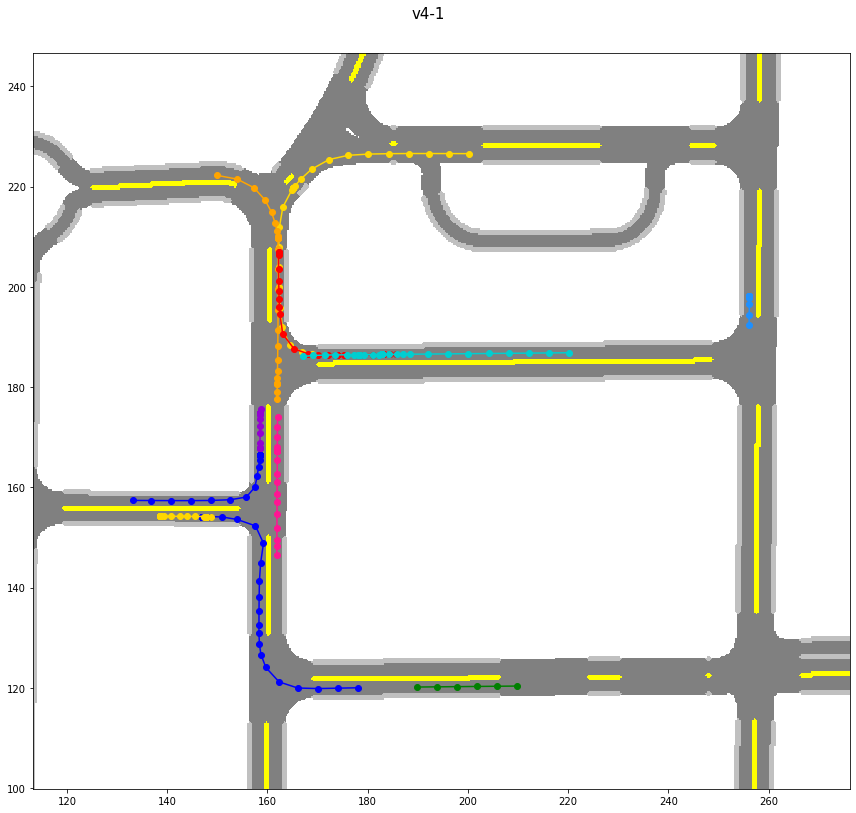

In [8]:
fig, ax = plt.subplots(figsize=(12,12))
node_ids = render_scene_nodes(ax, scene, zoom_in=True)
print(f"{len(node_ids)} nodes in scene: " + ' '.join(node_ids))
fig.tight_layout()
fig.suptitle(dataset.name, fontsize=15)
None

25 nodes in scene: 999 ego 1115 1097 1096 1090 1072 1071 1064 1073 1048 1060 1019 1027 1029 1009 1043 1046 1039 1102 1041 1004 1101 1091 1055


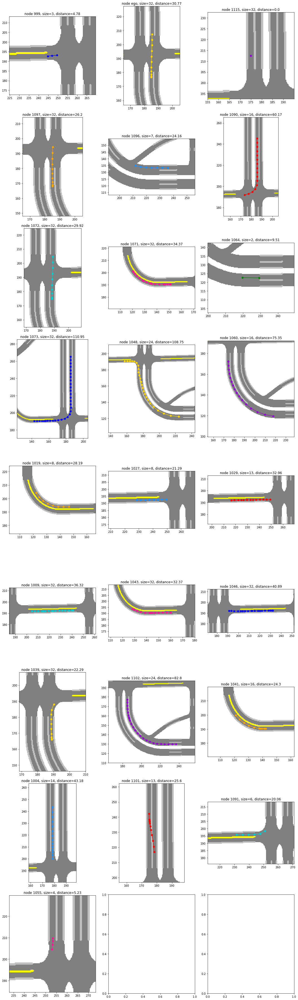

In [76]:
scene_df = scene_to_df(scene)
node_ids = scene_df['node_id'].unique()
N = len(node_ids)
print(f"{N} nodes in scene: " + ' '.join(node_ids))

fig, axes = plt.subplots(N // 3 + (N % 3 > 0), 3, figsize=(15, N*2))
axes = axes.ravel()
for idx, (ax, node_id) in enumerate(zip(axes, node_ids)):
    render_scene(ax, scene)
    node_df = scene_df[scene_df['node_id'] == node_id]
    X = node_df[['position_x', 'position_y']].values
    ax.plot(*X.T, '-o', color=AGENT_COLORS[idx % NCOLORS])
    x_min, y_min = np.min(X, axis=0)
    x_max, y_max = np.max(X, axis=0)
    ax.set_xlim([x_min - PADDING, x_max + PADDING])
    ax.set_ylim([y_min - PADDING, y_max + PADDING])
    sls = shapely.geometry.LineString(X)
    L = np.round(sls.length, 2)
    S = len(sls.coords)
    ax.set_title(f"node {node_id}, size={S}, distance={L}")

fig.tight_layout()

## Counting nodes in scenes

In [77]:
CACHEDIR = os.path.join(os.environ["APPROOT"], "cache")

def max_curvature(X):
    spline, _, distances = util.npu.interp_spline(X, normalize_interp=False, tol=0.1)
    length = distances[-1]
    s = np.linspace(0, length, 100)
    ddspline = spline.derivative(2)
    k = np.linalg.norm(ddspline(s), axis=1)
    k_blur, _ = util.npu.apply_kernel_1d(k, util.npu.kernel_1d_gaussian, 5, 3)
    k_max = np.max(k_blur)
    return k_max

# Maps sets of node attributes to sets of mutually exclusive node/scene attributes
NODEATTR_SCENEATTR_MAP = [
    ### counts in intersection
    ( ## mapping
        # node attribute
        ["is_complete_intersection"],
        # scene attribute
        ["complete_intersection"]
    ),(
        ["is_at_intersection", "is_significant_car"],
        ["significant_at_intersection"]
    ),(
        ["is_at_intersection", "is_stopped_car"],
        ["stopped_at_intersection"]
    ),(
        ["is_at_intersection"],
        ["other_at_intersection"]
    ),
    ### counts outside of intersection (other)
    (
        ["is_major_turn", "is_significant_car"],
        ["turn_at_other"]
    ),(
        ["is_minor_turn", "is_significant_car"],
        ["turn_at_other"]
    ),(
        ["is_significant_car"],
        ["significant_at_other"]
    ),(
        ["is_stopped_car"],
        ["stopped_at_other"]
    ),(
        [],
        ["other_at_other"]
    )
]

# List of scene attributes
SCENEATTRS = util.deduplicate(
    util.merge_list_of_list(util.map_to_list(util.second, NODEATTR_SCENEATTR_MAP))
)

class TrajectronSceneData(object):
    
    # Directory of cache
    MAP_NAMES = ["Town03", "Town04", "Town05", "Town06", "Town07", "Town10HD"]
    # radius used to check whether vehicle is in junction
    STOPPED_CAR_TOL = 1.0
    COUNTS_TEMPLATE = util.AttrDict(all=0, **{attr: 0 for attr in SCENEATTRS})

    def __construct_mappings_from_node(self):
        """Contstruct mappings from node."""
        # n_nodes : int
        #    Number of nodes.
        self.n_nodes = 0
        # nodeid_scene_dict : dict of (str, Scene)
        #    scene+node ID => scene the node is in
        self.nodeid_scene_dict = {}
        # sceneid_scene_dict : dict of (str, Scene)
        #    scene ID => scene
        self.sceneid_scene_dict = {}
        # sceneid_count_dict : dict of (str, util.AttrDict)
        #    scene ID => scene counts
        self.sceneid_count_dict = {}
        # map_nodeids_dict : dict of (str, list of str)
        #    map to scene+node ID => node
        self.map_nodeids_dict = {}
        # nodeid_node_dict : dict of (str, Node)
        #    node ID => node
        self.nodeid_node_dict = {}
        # nodeid_sls_dict : dict of (str, shapely.geometry.LineString)
        #    scene+node ID to node Shapely LineString
        self.nodeid_sls_dict = {}
        print("Getting trajectories of vehicles from every scene.", flush=True)
        for scene in tqdm(self.env.scenes):
            pos_adjust = np.array([scene.x_min, scene.y_min])
            map_name = carla_id_maker.extract_value(scene.name, "map")
            self.sceneid_count_dict[scene.name] = self.COUNTS_TEMPLATE.copy()
            self.sceneid_count_dict[scene.name].scene_id = scene.name
            self.sceneid_scene_dict[scene.name] = scene
            for node in scene.nodes:
                nodeid = scene.name + "/" + node.id
                self.nodeid_scene_dict[nodeid] = scene
                self.nodeid_node_dict[nodeid] = node
                util.setget_list_from_dict(
                    self.map_nodeids_dict, map_name
                ).append(nodeid)
                node_df = node_to_df(node)
                pos = node_df[["position_x", "position_y"]].values + pos_adjust
                sls = shapely.geometry.LineString(pos)
                self.nodeid_sls_dict[nodeid] = sls
                self.n_nodes += 1
    
    def __inspect_intersection_completedness(self, map_name, nodeid):
        """Whether a car completed an intersection
        (trajectory enters and exits the intersection)
        by checking containment twice."""
        sls = self.nodeid_sls_dict[nodeid]
        for smpoly in self.cached_map_data.map_to_smpolys[map_name]:
            spoly_enter = util.select(smpoly.geoms, 0)
            spoly_exit  = util.select(smpoly.geoms, 1)
            res = sls.intersection(spoly_enter)
            if not res.is_empty:
                res = sls.intersection(spoly_exit)
                if not res.is_empty:
                    return True
        return False
    
    def __inspect_intersectedness(self, map_name, nodeid):
        """Whether a car is in the intersection,
        and what its behavior is in it
        by checking intersection."""
        sls = self.nodeid_sls_dict[nodeid]
        for scircle in self.cached_map_data.map_to_scircles[map_name]:
            res = sls.intersection(scircle)
            if not res.is_empty:
                return True
        return False
    
    def __inspect_distance(self, map_name, nodeid):
        """Whether a car is moving significantly
        (at least 10m and 10 steps) by checking line properties."""
        is_significant_car = False
        is_stopped_car = False
        sls = self.nodeid_sls_dict[nodeid]
        S = len(sls.coords)
        L = sls.length
        if S >= 10 and L >= 10.0:
            is_significant_car = True
        elif L < self.STOPPED_CAR_TOL:
            is_stopped_car = True
        return (
            is_significant_car,
            is_stopped_car
        )
    
    def __inspect_curvature(self, map_name, nodeid):
        """Inspect curvature of trajectory.
        A major turn has curvature over 0.1.
        A minor turn has curvature between 0.01, 0.1.
        """
        is_major_turn = False
        is_minor_turn = False
        sls = self.nodeid_sls_dict[nodeid]
        X = np.array(sls.coords)
        try:
            k_max = max_curvature(X)
            if k_max >= 0.1:
                is_major_turn = True
            elif k_max >= 0.01:
                is_minor_turn = True
        except ValueError:
            pass
        return (
            is_major_turn,
            is_minor_turn
        )
#         curvature, _, _ = trajectory_curvature(np.array(sls.coords))
#         if curvature > 0.1:
#             is_major_turn = True
#         if curvature > 0.05:
#             is_minor_turn = True
#         return is_major_turn, is_minor_turn
    
    def __inspect_node(self, map_name, nodeid):
        """Label the given node by inspecting the node's properties."""
        (
            is_complete_intersection
        ) = self.__inspect_intersection_completedness(map_name, nodeid)
        (
            is_at_intersection
        ) = self.__inspect_intersectedness(map_name, nodeid)
        (
            is_significant_car,
            is_stopped_car
        ) = self.__inspect_distance(map_name, nodeid)
        (
            is_major_turn,
            is_minor_turn
        ) = self.__inspect_curvature(map_name, nodeid)
        return util.AttrDict(
            node_id=nodeid,
            is_complete_intersection=is_complete_intersection,
            is_at_intersection=is_at_intersection,
            is_significant_car=is_significant_car,
            is_stopped_car=is_stopped_car,
            is_major_turn=is_major_turn,
            is_minor_turn=is_minor_turn
        )
    
    def __inspect_nodes(self):
        """Inspect each node and gather node attributes."""
        print("Inspecting node data.", flush=True)
        nodeattrs = []
        with tqdm(total=self.n_nodes) as pbar:
            for map_name, nodeids in self.map_nodeids_dict.items():
                for nodeid in nodeids:
                    nodeattr = self.__inspect_node(map_name, nodeid)
                    nodeattrs.append(nodeattr)
                    pbar.update(1)
        return nodeattrs
    
    def __count_node(self, nodeattr):
        """Update count of a scene given a node."""
        nodeid = nodeattr.node_id
        counts = self.sceneid_count_dict[self.nodeid_scene_dict[nodeid].name]
        for _counts in [counts, self.total_counts]:
            _counts.all += 1
            for _nodeattrnames, _sceneattrnames in NODEATTR_SCENEATTR_MAP:
                if all([nodeattr[_nodeattrname] for _nodeattrname in _nodeattrnames]):
                    for _sceneattrname in _sceneattrnames:
                        _counts[_sceneattrname] += 1
                    break
    
    def __count_nodes(self, nodeattrs):
        """Count nodes in each scene."""
        self.total_counts = self.COUNTS_TEMPLATE.copy()
        self.nodeattr_df = pd.DataFrame.from_records(nodeattrs)
        for i, nodeattr in self.nodeattr_df.iterrows():
            self.__count_node(nodeattr)
    
    def __extract_data(self):
        self.__construct_mappings_from_node()
        nodeattrs = self.__inspect_nodes()
        self.__count_nodes(nodeattrs)
                
    def __init__(self, env):
        self.env = env
        self.cached_map_data = CachedMapData()
        self.__extract_data()

    def inspect_node(self, scene, node):
        map_name = carla_id_maker.extract_value(scene.name, "map")
        nodeid = scene.name + "/" + node.id
        nodeattr = self.__inspect_node(map_name, nodeid)
        
        for _nodeattrnames, _sceneattrnames in NODEATTR_SCENEATTR_MAP:
            if all([nodeattr[_nodeattrname] for _nodeattrname in _nodeattrnames]):
                nodeattr.classification = _sceneattrnames.copy()
                break
        return nodeattr
        
        
    def set_node_fm(self, fm_modification):
        """Set node frequency multiplier."""
        for i, nodeattr in self.nodeattr_df.iterrows():
            nodeid = nodeattr.node_id
            node = self.nodeid_node_dict[nodeid]
            
            for _nodeattrnames, _sceneattrnames in NODEATTR_SCENEATTR_MAP:
                if all([nodeattr[_nodeattrname] for _nodeattrname in _nodeattrnames]):
                    for _sceneattrname in _sceneattrnames:
                        node.frequency_multiplier = (
                            fm_modification[_sceneattrname]
                        )
                    break

    def select_scenes(self):
        count_df = pd.DataFrame.from_records([*self.sceneid_count_dict.values()])
        mask = np.logical_or.reduce([
            count_df["complete_intersection"] > 4,
            count_df["significant_at_intersection"] > 4,
            count_df["turn_at_other"] > 4,
            count_df["significant_at_other"] > 4,
        ])

        n = len(count_df)
        n1 = np.sum(mask)
        n2 = n - n1
        a1 = 9 * n2 / n1
        print(
            f"total n={n}, selected n1={n1}, not selected n2={n2}, multiplier a1={a1}, "
            f"expected proportion of selected {a1*n1 / (a1*n1 + n2)}"
        )
        count_df.loc[mask, "weight"] = a1
        count_df.loc[~mask, "weight"] = 1

        n_samples = 300
        sample_df = count_df.sample(n_samples, replace=False, weights="weight")
        for i, scene_id in zip(range(20), sample_df["scene_id"]):
            scene = self.sceneid_scene_dict[scene_id]
            print(scene)
                    
    def log_node_count(self):
        """Log total node counts, and save a histogram plot of node counts in scenes."""
        count_df = pd.DataFrame.from_records([*self.sceneid_count_dict.values()])
        print("node mutually-exclusive labels")
        print(*count_df.columns.values, sep=", ")
        print()
        print("total node count")
        n_all = self.total_counts.all
        for x in self.total_counts.items():
            print(x[0],":", x[1], ",", round(x[1] / n_all, 2))

        hist_attrs = util.AttrDict(bins=30, range=(0, 30))
        fig = plt.figure(figsize=(15, 15))

        ax = fig.add_subplot(421)
        selector = "complete_intersection"
        count_df[selector].hist(ax=ax, **hist_attrs)
        ax.set_title(selector)

        ax = fig.add_subplot(422)
        selector = "significant_at_intersection"
        count_df[selector].hist(ax=ax, **hist_attrs)
        ax.set_title(selector)

        ax = fig.add_subplot(423)
        selector = "stopped_at_intersection"
        count_df[selector].hist(ax=ax, **hist_attrs)
        ax.set_title(selector)

        ax = fig.add_subplot(424)
        selector = "other_at_intersection"
        count_df[selector].hist(ax=ax, **hist_attrs)
        ax.set_title(selector)

        ax = fig.add_subplot(425)
        selector = "turn_at_other"
        count_df[selector].hist(ax=ax, **hist_attrs)
        ax.set_title(selector)

        ax = fig.add_subplot(426)
        selector = "significant_at_other"
        count_df[selector].hist(ax=ax, **hist_attrs)
        ax.set_title(selector)

        ax = fig.add_subplot(427)
        selector = "stopped_at_other"
        count_df[selector].hist(ax=ax, **hist_attrs)
        ax.set_title(selector)

        ax = fig.add_subplot(428)
        selector = "other_at_other"
        count_df[selector].hist(ax=ax, **hist_attrs)
        ax.set_title(selector)

        for ax in fig.get_axes():
            ax.set_xlabel("Count of nodes per scene")
            ax.set_ylabel("Number of scenes")
        fig.suptitle("Histogram of node labels in scenes")
        fig.tight_layout()


In [32]:
scene_data = TrajectronSceneData(eval_env)

Getting trajectories of vehicles from every scene.


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:03<00:00, 125.09it/s]

Inspecting node data.



100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11102/11102 [00:55<00:00, 200.51it/s]


In [13]:
supscene_df = pd.merge(scenes_to_df(eval_env.scenes), scene_data.nodeattr_df, how="left", on=["node_id"])
supscene_df.head()

,frame_id,node_id,position_x,position_y,velocity_x,velocity_y,acceleration_x,acceleration_y,heading_x,heading_y,...,heading_d°,velocity_norm,acceleration_norm,scene_id,is_complete_intersection,is_at_intersection,is_significant_car,is_stopped_car,is_major_turn,is_minor_turn
0,0,Town06/ep017/agent4632/frame00004594/4634,217.410339,173.765327,8.084351,0.004883,0.679016,-0.000351,1.0,0.000664,...,-0.000291,8.084352,0.679016,Town06/ep017/agent4632/frame00004594,False,True,True,False,False,True
1,1,Town06/ep017/agent4632/frame00004594/4634,221.452515,173.767769,8.423859,0.004707,1.818787,0.000149,1.0,0.000518,...,-0.000156,8.423860,1.818787,Town06/ep017/agent4632/frame00004594,False,True,True,False,False,True
2,2,Town06/ep017/agent4632/frame00004594/4634,225.834198,173.770035,9.903137,0.005032,3.605103,0.000458,1.0,0.000508,...,-0.000037,9.903138,3.605103,Town06/ep017/agent4632/frame00004594,False,True,True,False,False,True
3,3,Town06/ep017/agent4632/frame00004594/4634,231.355652,173.772800,12.028961,0.005165,3.997314,0.000271,1.0,0.000481,...,-0.000259,12.028962,3.997314,Town06/ep017/agent4632/frame00004594,False,True,True,False,False,True
4,4,Town06/ep017/agent4632/frame00004594/4634,237.863159,173.775200,13.900452,0.005302,2.879669,0.001270,1.0,0.000249,...,-0.000030,13.900453,2.879669,Town06/ep017/agent4632/frame00004594,False,True,True,False,False,True


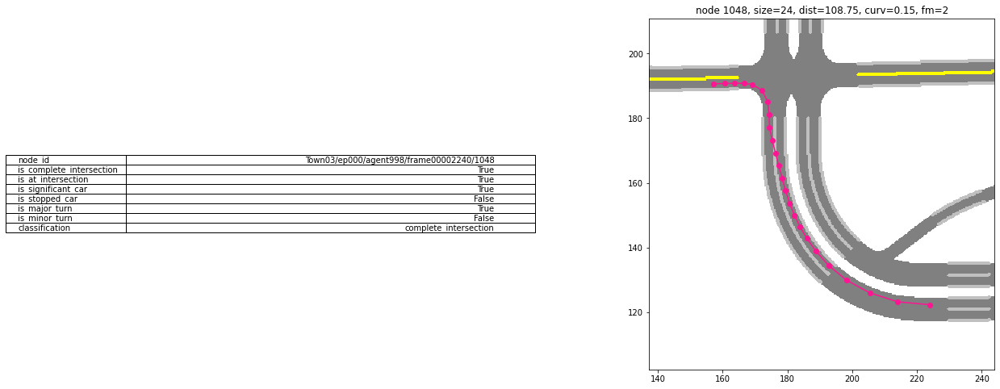

In [99]:
scene = eval_scenes[16]
scene_df = scene_to_df(scene)
node = scene.nodes[10]
node_id = node.id

fig, axes = plt.subplots(1, 2, figsize=(20, 8))
render_scene(axes[1], scene)
node_df = scene_df[scene_df['node_id'] == node_id]
X = node_df[['position_x', 'position_y']].values
axes[1].plot(*X.T, '-o', color=AGENT_COLORS[idx % NCOLORS])
x_min, y_min = np.min(X, axis=0)
x_max, y_max = np.max(X, axis=0)
axes[1].set_xlim([x_min - PADDING, x_max + PADDING])
axes[1].set_ylim([y_min - PADDING, y_max + PADDING])
sls = shapely.geometry.LineString(X)
L = np.round(sls.length, 2)
S = len(sls.coords)
try:
    K = round(max_curvature(X), 2)
except ValueError:
    K = np.NaN
fm = node.frequency_multiplier
axes[1].set_title(f"node {node_id}, size={S}, dist={L}, curv={K}, fm={fm}")

nodeattrs = scene_data.inspect_node(scene, node)

rowLabels = list(nodeattrs.keys())
l = list(nodeattrs.values())
l[-1] = l[-1][0]
cellText = [[str(v)] for v in l]
axes[0].table(rowLabels=rowLabels, cellText=cellText, loc='center')
axes[0].axis("off"); None

## Visualize nodes in scenes with given label

In [14]:
def max_curvature(X):
    spline, _, distances = util.npu.interp_spline(X, normalize_interp=False, tol=0.1)
    length = distances[-1]
    s = np.linspace(0, length, 100)
    ddspline = spline.derivative(2)
    k = np.linalg.norm(ddspline(s), axis=1)
    k_blur, _ = util.npu.apply_kernel_1d(k, util.npu.kernel_1d_gaussian, 5, 3)
    k_max = np.max(k_blur)
    return k_max

def plot_scene_data(axes, scene_data, node_ids, df):
    for idx, (ax, node_id) in enumerate(zip(axes, node_ids)):
        scene = scene_data.nodeid_scene_dict[node_id]
        render_scene(ax, scene)
        selector = df["node_id"] == node_id
        node_df = df[selector]
        X = node_df[['position_x', 'position_y']].values
        ax.plot(*X.T, '-o', color=AGENT_COLORS[idx % NCOLORS])
        x_min, y_min = np.min(X, axis=0)
        x_max, y_max = np.max(X, axis=0)
        ax.set_xlim([x_min - PADDING, x_max + PADDING])
        ax.set_ylim([y_min - PADDING, y_max + PADDING])
        sls = shapely.geometry.LineString(X)
        L = np.round(sls.length, 2)
        S = len(sls.coords)
        node_id = scene_data.nodeid_node_dict[node_id].id
        K = round(max_curvature(X), 2)
        ax.set_title(f"node {node_id}, size={S}, dist={L}, curv={K}")

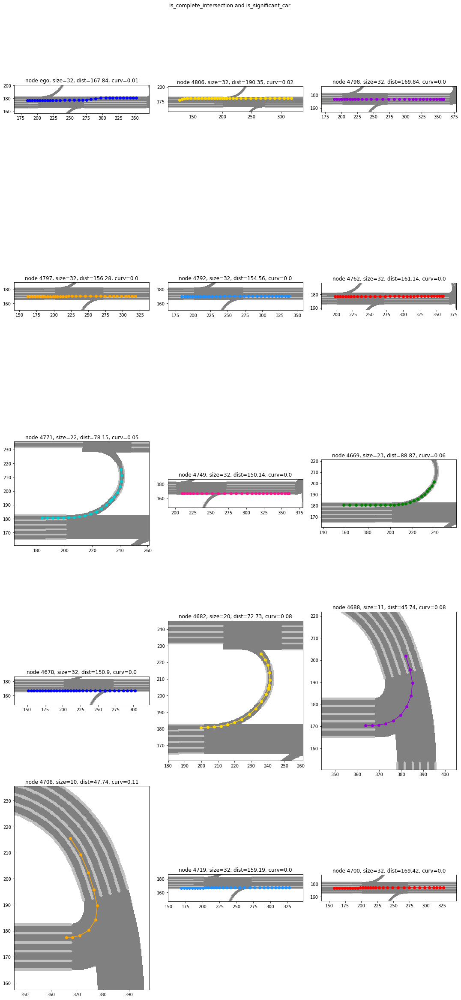

In [15]:
selector = supscene_df["is_complete_intersection"] & supscene_df["is_significant_car"]
is_complete_intersection = supscene_df[selector]
node_ids = is_complete_intersection["node_id"].unique()

N = 5
fig, axes = plt.subplots(N, 3, figsize=(15, (N/3)*20))
axes = axes.ravel()
plot_scene_data(axes, scene_data, node_ids, is_complete_intersection)
fig.tight_layout()
fig.suptitle("is_complete_intersection and is_significant_car"); None

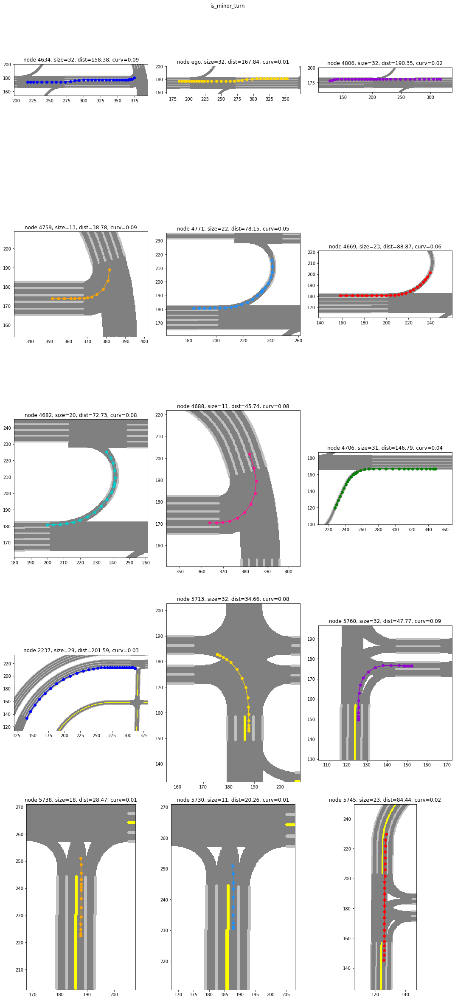

In [16]:
selector = supscene_df["is_minor_turn"] & supscene_df["is_significant_car"]
is_minor_turn = supscene_df[selector]
node_ids = is_minor_turn["node_id"].unique()

N = 5
fig, axes = plt.subplots(N, 3, figsize=(15, (N/3)*20))
axes = axes.ravel()
plot_scene_data(axes, scene_data, node_ids, is_minor_turn)
fig.tight_layout()
fig.suptitle("is_minor_turn"); None

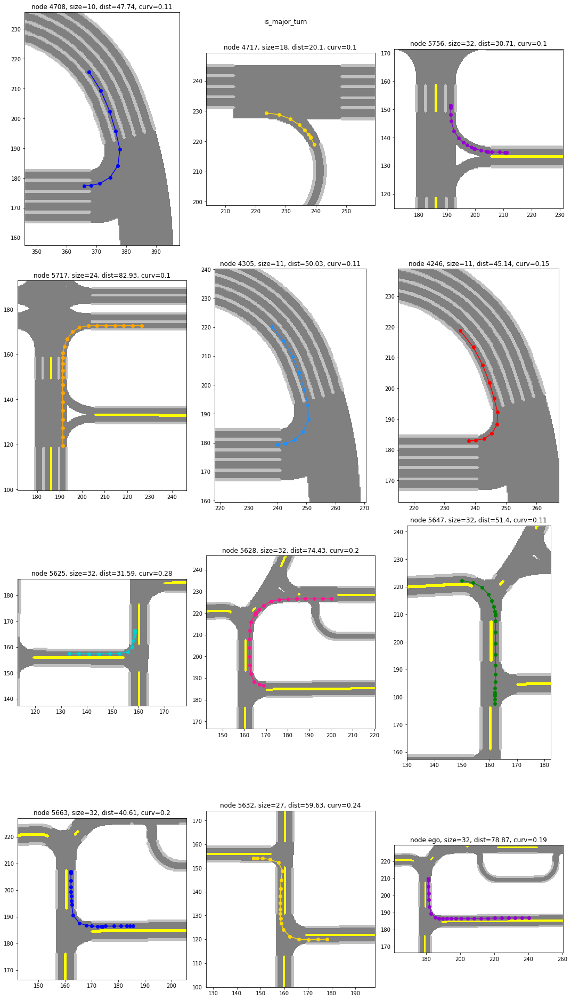

In [17]:
selector = supscene_df["is_major_turn"] & supscene_df["is_significant_car"]
is_major_turn = supscene_df[selector]
node_ids = is_major_turn["node_id"].unique()

N = 4
fig, axes = plt.subplots(N, 3, figsize=(15, (N/3)*20))
axes = axes.ravel()
plot_scene_data(axes, scene_data, node_ids, is_major_turn)
fig.tight_layout()
fig.suptitle("is_major_turn"); None

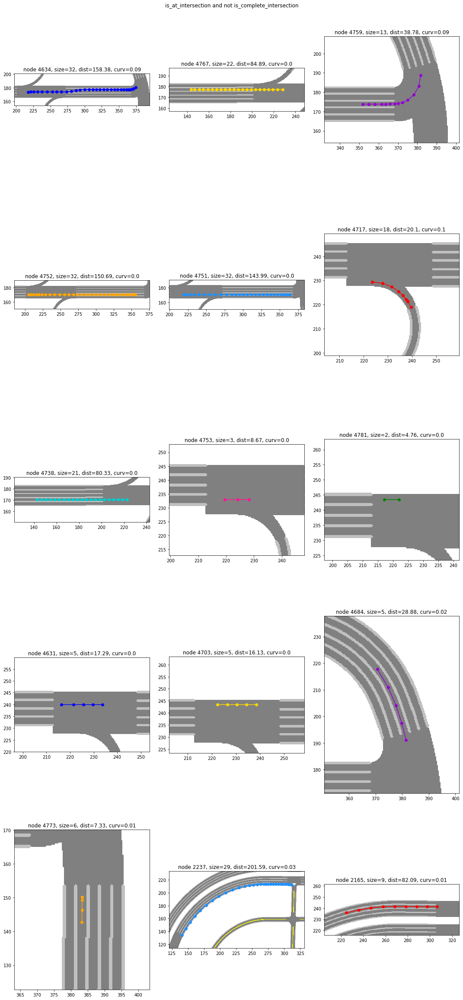

In [18]:
selector = supscene_df["is_at_intersection"] \
    & ~supscene_df["is_complete_intersection"]
is_major_turn = supscene_df[selector]
node_ids = is_major_turn["node_id"].unique()

N = 5
fig, axes = plt.subplots(N, 3, figsize=(15, (N/3)*20))
axes = axes.ravel()
plot_scene_data(axes, scene_data, node_ids, is_major_turn)
fig.tight_layout()
fig.suptitle("is_at_intersection and not is_complete_intersection"); None

## Max Curvature

Clean way to compute the max curvature of a trajectory, eliminating spiking values do to interpolation artifacts.

Town04/ep009/agent2792/frame00009604/ego


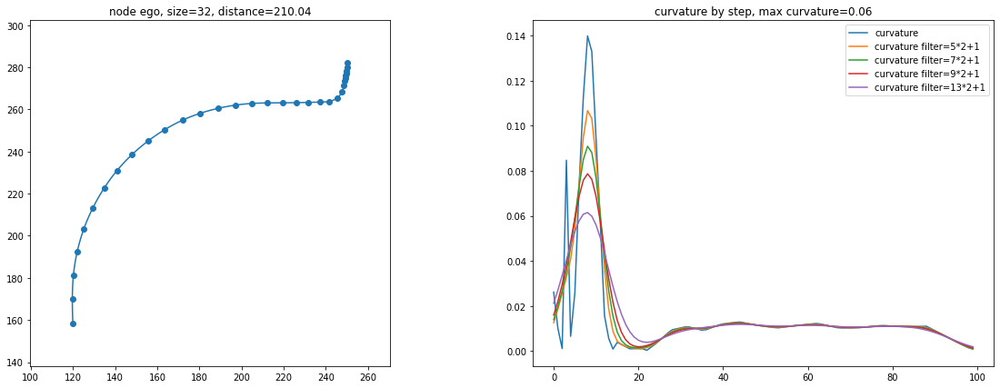

In [12]:
# Computing max curvature of a car motion trajectory

selector = supscene_df["is_complete_intersection"] & supscene_df["is_significant_car"]
is_complete_intersection = supscene_df[selector]
node_ids = is_complete_intersection["node_id"].unique()

# selector = supscene_df["is_major_turn"]# & supscene_df["is_significant_car"]
# is_major_turn = supscene_df[selector]
# node_ids = is_major_turn["node_id"].unique()

# selector = supscene_df["is_minor_turn"]# & supscene_df["is_significant_car"]
# is_minor_turn = supscene_df[selector]
# node_ids = is_minor_turn["node_id"].unique()

# selector = supscene_df["is_at_intersection"] & ~supscene_df["is_complete_intersection"]
# is_major_turn = supscene_df[selector]
# node_ids = is_major_turn["node_id"].unique()

node_id = node_ids[8]
print(node_id)
selector = supscene_df["node_id"] == node_id
node_df = supscene_df[selector]
X = node_df[['position_x', 'position_y']].values

spline, _, distances = util.npu.interp_spline(X, normalize_interp=False, tol=1e-2)
length = distances[-1]
s = np.linspace(0, length, 100)
ddspline = spline.derivative(2)
k = np.linalg.norm(ddspline(s), axis=1)

fig = plt.figure(figsize=(20, 7))
ax = fig.add_subplot(121)
ax.scatter(*X.T, label="path points")
ax.plot(*spline(s).T, label="path spline")
sls = shapely.geometry.LineString(X)
L = np.round(sls.length, 2)
S = len(sls.coords)
node_id = scene_data.nodeid_node_dict[node_id].id
ax.set_title(f"node {node_id}, size={S}, distance={L}")
ax.set_aspect("equal")

x_min, y_min = np.min(X, axis=0)
x_max, y_max = np.max(X, axis=0)
ax.set_xlim([x_min - PADDING, x_max + PADDING])
ax.set_ylim([y_min - PADDING, y_max + PADDING])

ax = fig.add_subplot(122)
ax.plot(k, label="curvature")
k_blur_1, _ = util.npu.apply_kernel_1d(k, util.npu.kernel_1d_gaussian, 5, 3)
k_blur_2, _ = util.npu.apply_kernel_1d(k, util.npu.kernel_1d_gaussian, 7, 3)
k_blur_3, _ = util.npu.apply_kernel_1d(k, util.npu.kernel_1d_gaussian, 9, 3)
k_blur_4, _ = util.npu.apply_kernel_1d(k, util.npu.kernel_1d_gaussian, 13, 3)
ax.plot(k_blur_1, label="curvature filter=5*2+1")
ax.plot(k_blur_2, label="curvature filter=7*2+1")
ax.plot(k_blur_3, label="curvature filter=9*2+1")
ax.plot(k_blur_4, label="curvature filter=13*2+1")
ax.legend()
k_blur, _ = util.npu.apply_kernel_1d(k, util.npu.kernel_1d_gaussian, 13, 3)
k_max = round(np.max(k_blur), 2)
ax.set_title(f"curvature by step, max curvature={k_max}"); None

## Count occurances of nodes

In [100]:
count_df = pd.DataFrame.from_records([*scene_data.sceneid_count_dict.values()])
print("node classification labels")
print(*count_df.columns.values, sep=", ")
print()
# recall the counts are non-overlapping
print("total counts of nodes")
n_all = scene_data.total_counts.all
for x in scene_data.total_counts.items():
    print(x[0],":", x[1], ",", round(x[1] / n_all, 2))
"""prioritize these:
significant_at_other
turn_at_other
complete_intersection
significant_at_intersection
"""; None

node classification labels
all, complete_intersection, significant_at_intersection, stopped_at_intersection, other_at_intersection, turn_at_other, significant_at_other, stopped_at_other, other_at_other, scene_id

total counts of nodes
all : 11102 , 1.0
complete_intersection : 2816 , 0.25
significant_at_intersection : 2060 , 0.19
stopped_at_intersection : 217 , 0.02
other_at_intersection : 1306 , 0.12
turn_at_other : 625 , 0.06
significant_at_other : 844 , 0.08
stopped_at_other : 1732 , 0.16
other_at_other : 1502 , 0.14


## Counting occurrences in scenes 

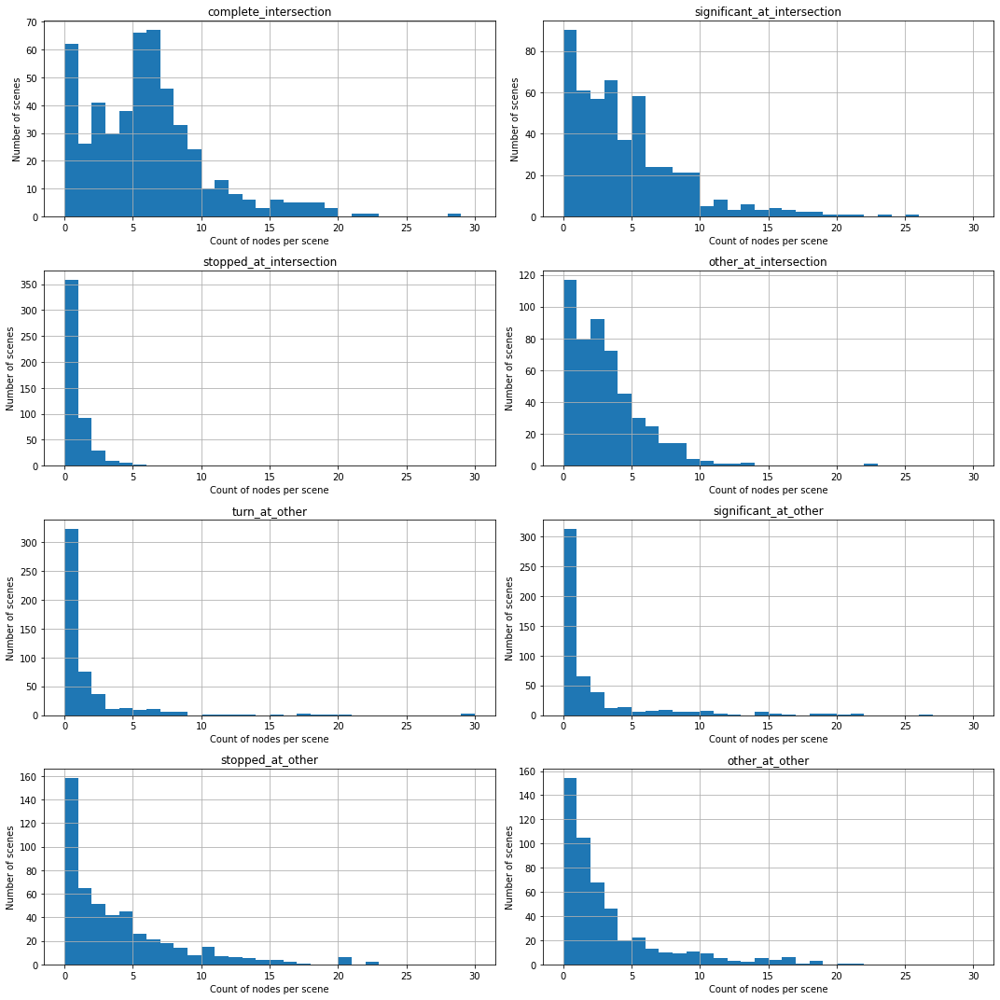

In [101]:
# count of occurance in scene
hist_attrs = util.AttrDict(bins=30, range=(0, 30))
fig = plt.figure(figsize=(15, 15))

ax = fig.add_subplot(421)
selector = "complete_intersection"
count_df[selector].hist(ax=ax, **hist_attrs)
ax.set_title(selector)

ax = fig.add_subplot(422)
selector = "significant_at_intersection"
count_df[selector].hist(ax=ax, **hist_attrs)
ax.set_title(selector)

ax = fig.add_subplot(423)
selector = "stopped_at_intersection"
count_df[selector].hist(ax=ax, **hist_attrs)
ax.set_title(selector)

ax = fig.add_subplot(424)
selector = "other_at_intersection"
count_df[selector].hist(ax=ax, **hist_attrs)
ax.set_title(selector)


ax = fig.add_subplot(425)
selector = "turn_at_other"
count_df[selector].hist(ax=ax, **hist_attrs)
ax.set_title(selector)

ax = fig.add_subplot(426)
selector = "significant_at_other"
count_df[selector].hist(ax=ax, **hist_attrs)
ax.set_title(selector)

ax = fig.add_subplot(427)
selector = "stopped_at_other"
count_df[selector].hist(ax=ax, **hist_attrs)
ax.set_title(selector)

ax = fig.add_subplot(428)
selector = "other_at_other"
count_df[selector].hist(ax=ax, **hist_attrs)
ax.set_title(selector)

for ax in fig.get_axes():
    ax.set_xlabel("Count of nodes per scene")
    ax.set_ylabel("Number of scenes")
fig.tight_layout()

selecting all


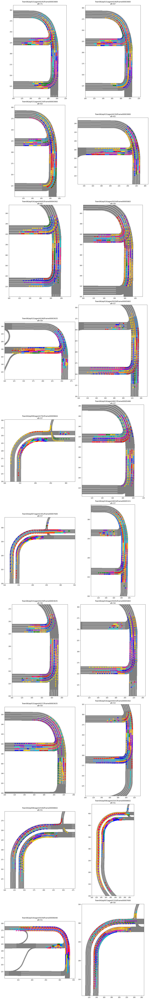

In [92]:
N = 10
fig, axes = plt.subplots(N, 2, figsize=(15, (N/2)*20))
axes = axes.ravel()

select_label = "all"
count_df.sort_values(select_label, inplace=True, ascending=False)
for ax, (i, row) in zip(axes, count_df[[select_label, "scene_id"]][:(2*N)].iterrows()):
    scene = scene_data.sceneid_scene_dict[row.scene_id]
    render_scene_nodes(ax, scene, zoom_in=True)
    ax.set_title(f"{row.scene_id}\n{select_label}={row[select_label]}")

fig.tight_layout()
print("selecting", select_label)
# tends to select map Town 4,6 highways with many cars.

selecting complete_intersection


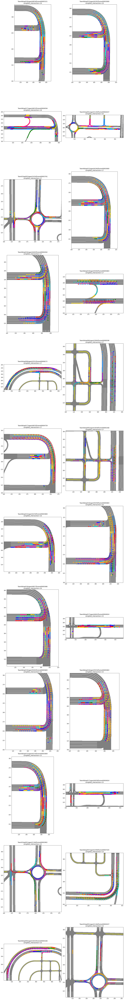

In [95]:
N = 12
fig, axes = plt.subplots(N, 2, figsize=(15, (N/2)*20))
axes = axes.ravel()

select_label = "complete_intersection"
count_df.sort_values(select_label, inplace=True, ascending=False)
for ax, (i, row) in zip(axes, count_df[[select_label, "scene_id"]][:(2*N)].iterrows()):
    scene = scene_data.sceneid_scene_dict[row.scene_id]
    render_scene_nodes(ax, scene, zoom_in=True)
    ax.set_title(f"{row.scene_id}\n{select_label}={row[select_label]}")

fig.tight_layout()
print("selecting", select_label)
# Towns 3,4,6

selecting significant_at_intersection


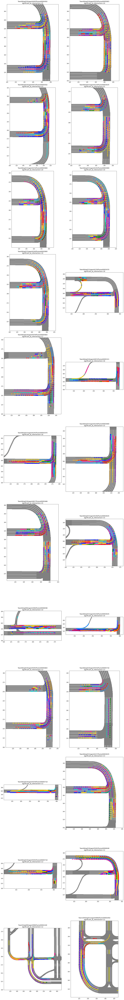

In [100]:
N = 12
fig, axes = plt.subplots(N, 2, figsize=(15, (N/2)*20))
axes = axes.ravel()

select_label = "significant_at_intersection"
count_df.sort_values(select_label, inplace=True, ascending=False)
for ax, (i, row) in zip(axes, count_df[[select_label, "scene_id"]][:(2*N)].iterrows()):
    scene = scene_data.sceneid_scene_dict[row.scene_id]
    render_scene_nodes(ax, scene, zoom_in=True)
    ax.set_title(f"{row.scene_id}\n{select_label}={row[select_label]}")

fig.tight_layout()
print("selecting", select_label)
# Towns 3,4,6

selecting significant_at_other


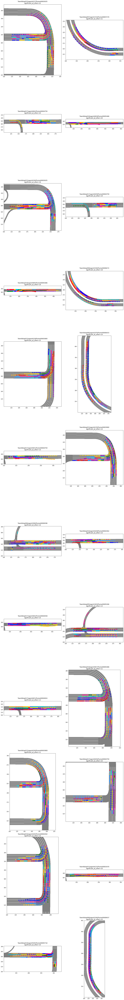

In [102]:
N = 12
fig, axes = plt.subplots(N, 2, figsize=(15, (N/2)*20))
axes = axes.ravel()

select_label = "significant_at_other"
count_df.sort_values(select_label, inplace=True, ascending=False)
for ax, (i, row) in zip(axes, count_df[[select_label, "scene_id"]][:(2*N)].iterrows()):
    scene = scene_data.sceneid_scene_dict[row.scene_id]
    render_scene_nodes(ax, scene, zoom_in=True)
    ax.set_title(f"{row.scene_id}\n{select_label}={row[select_label]}")

fig.tight_layout()
print("selecting", select_label)
# Towns 3,4,6

selecting turn_at_other


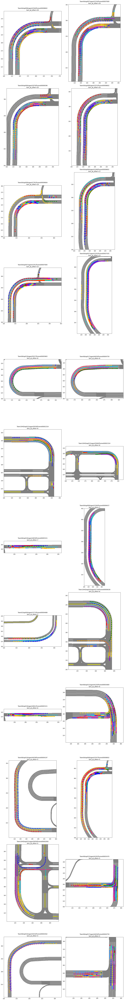

In [103]:
N = 12
fig, axes = plt.subplots(N, 2, figsize=(15, (N/2)*20))
axes = axes.ravel()

select_label = "turn_at_other"
count_df.sort_values(select_label, inplace=True, ascending=False)
for ax, (i, row) in zip(axes, count_df[[select_label, "scene_id"]][:(2*N)].iterrows()):
    scene = scene_data.sceneid_scene_dict[row.scene_id]
    render_scene_nodes(ax, scene, zoom_in=True)
    ax.set_title(f"{row.scene_id}\n{select_label}={row[select_label]}")

fig.tight_layout()
print("selecting", select_label)
# Mostly long highway in Town 4,6

selecting stopped_at_intersection


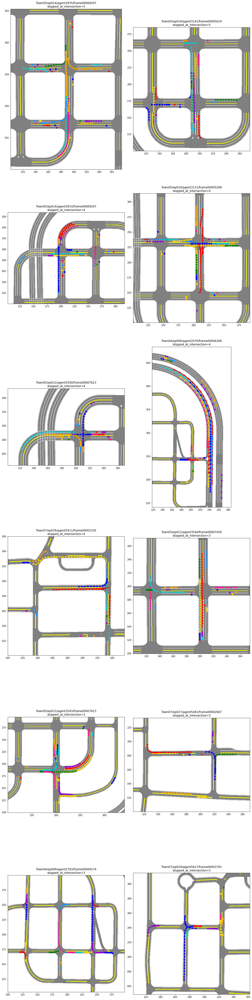

In [94]:
N = 12
fig, axes = plt.subplots(N, 2, figsize=(15, (N/2)*20))
axes = axes.ravel()

select_label = "stopped_at_intersection"
count_df.sort_values(select_label, inplace=True, ascending=False)
for ax, (i, row) in zip(axes, count_df[[select_label, "scene_id"]][:(2*N)].iterrows()):
    scene = scene_data.sceneid_scene_dict[row.scene_id]
    render_scene_nodes(ax, scene, zoom_in=True)
    ax.set_title(f"{row.scene_id}\n{select_label}={row[select_label]}")

fig.tight_layout()
print("selecting", select_label)
# Towns 3,4,6

selecting other_at_other


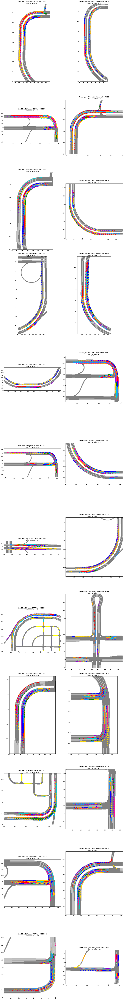

In [104]:
N = 12
fig, axes = plt.subplots(N, 2, figsize=(15, (N/2)*20))
axes = axes.ravel()

select_label = "other_at_other"
count_df.sort_values(select_label, inplace=True, ascending=False)
for ax, (i, row) in zip(axes, count_df[[select_label, "scene_id"]][:(2*N)].iterrows()):
    scene = scene_data.sceneid_scene_dict[row.scene_id]
    render_scene_nodes(ax, scene, zoom_in=True)
    ax.set_title(f"{row.scene_id}\n{select_label}={row[select_label]}")

fig.tight_layout()
print("selecting", select_label)

Inspect node counts from scene idx 4 in Town07


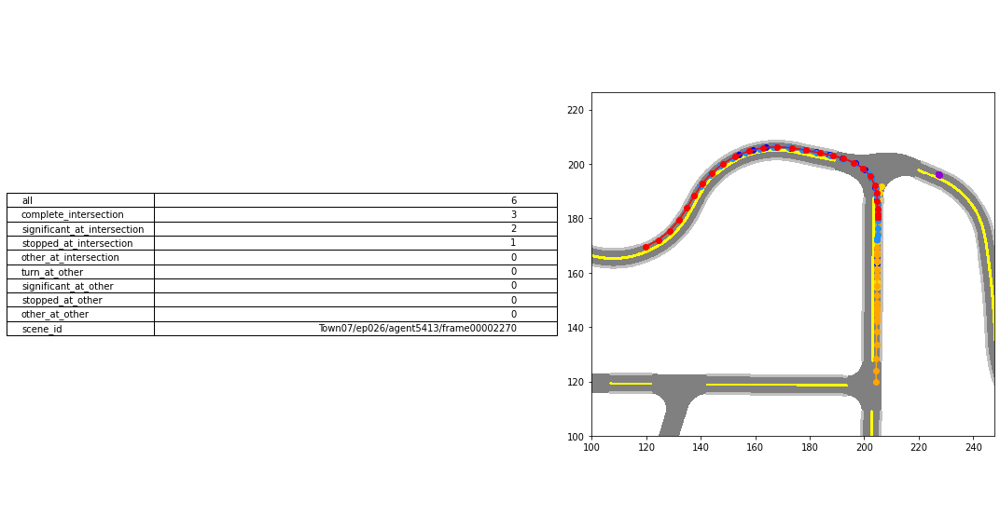

In [42]:
map_name = "Town07"
scene_idx = 4
map_sceneid_dict, labels = carla_id_maker.group_ids(scene_data.sceneid_scene_dict.keys(), ["map"])
sceneid = map_sceneid_dict[map_name][scene_idx]
scene = scene_data.sceneid_scene_dict[sceneid]
print(f"Inspect node counts from scene idx {scene_idx} in {map_name}")

fig, axes = plt.subplots(1, 2, figsize=(15, 8))
rowLabels = count_df[count_df["scene_id"] == sceneid].T.index
cellText = count_df[count_df["scene_id"] == sceneid].T.values
axes[0].table(rowLabels=rowLabels, cellText=cellText, loc='center')
axes[0].axis("off")
render_scene_nodes(axes[1], scene, zoom_in=True)
fig.tight_layout()

Inspect node counts from scene idx 3 in Town05


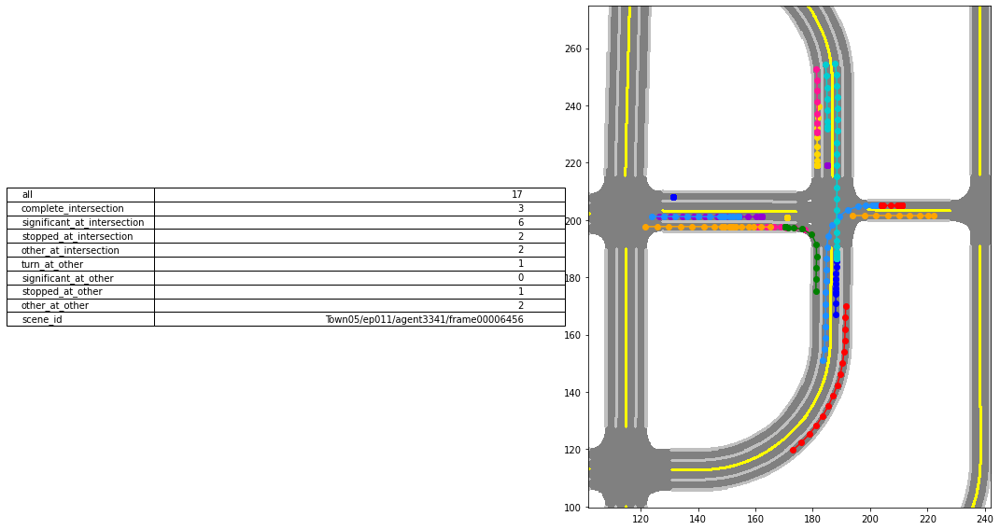

In [43]:
map_name = "Town05"
scene_idx = 3
map_sceneid_dict, labels = carla_id_maker.group_ids(scene_data.sceneid_scene_dict.keys(), ["map"])
sceneid = map_sceneid_dict[map_name][scene_idx]
scene = scene_data.sceneid_scene_dict[sceneid]
print(f"Inspect node counts from scene idx {scene_idx} in {map_name}")

fig, axes = plt.subplots(1, 2, figsize=(15, 8))
rowLabels = count_df[count_df["scene_id"] == sceneid].T.index
cellText = count_df[count_df["scene_id"] == sceneid].T.values
axes[0].table(rowLabels=rowLabels, cellText=cellText, loc='center')
axes[0].axis("off")
render_scene_nodes(axes[1], scene, zoom_in=True)
fig.tight_layout()

Inspect node counts from scene idx 0 in Town10HD
Index(['all', 'complete_intersection', 'significant_at_intersection',
       'stopped_at_intersection', 'other_at_intersection', 'turn_at_other',
       'significant_at_other', 'stopped_at_other', 'other_at_other',
       'scene_id'],
      dtype='object')
[[25]
 [6]
 [3]
 [3]
 [2]
 [0]
 [0]
 [10]
 [1]
 ['Town10HD/ep020/agent5719/frame00000803']]


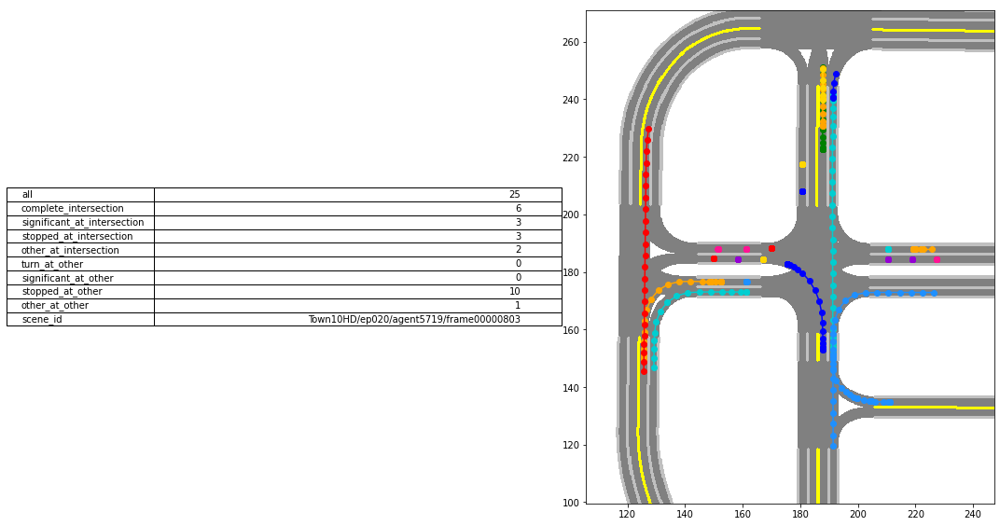

In [56]:
map_name = "Town10HD"
scene_idx = 0
map_sceneid_dict, labels = carla_id_maker.group_ids(scene_data.sceneid_scene_dict.keys(), ["map"])
sceneid = map_sceneid_dict[map_name][scene_idx]
scene = scene_data.sceneid_scene_dict[sceneid]
print(f"Inspect node counts from scene idx {scene_idx} in {map_name}")

fig, axes = plt.subplots(1, 2, figsize=(15, 8))
rowLabels = count_df[count_df["scene_id"] == sceneid].T.index
cellText = count_df[count_df["scene_id"] == sceneid].T.values
axes[0].table(rowLabels=rowLabels, cellText=cellText, loc='center')
axes[0].axis("off")
render_scene_nodes(axes[1], scene, zoom_in=True)
fig.tight_layout()

## Weighted sampling of scene

In [190]:
"""prioritize these:
significant_at_other
turn_at_other
complete_intersection
significant_at_intersection
"""

count_df = pd.DataFrame.from_records(iter(scene_data.sceneid_count_dict.values()))
mask = np.logical_or.reduce([
    count_df["complete_intersection"] > 4,
    count_df["significant_at_intersection"] > 4,
    count_df["turn_at_other"] > 4,
    count_df["significant_at_other"] > 4,
])

n = len(count_df)
n1 = np.sum(mask)
n2 = n - n1
a1 = 9 * n2 / n1
print(
    f"total n={n}, selected n1={n1}, not selected n2={n2}, multiplier a1={a1}, "
    f"expected proportion of selected {a1*n1 / (a1*n1 + n2)}"
)

count_df.loc[mask, "weight"] = a1
count_df.loc[~mask, "weight"] = 1

n_samples = 300
sample_df = count_df.sample(n_samples, replace=False, weights="weight")
list(sample_df["scene_id"])
# for i, scene_id in zip(range(20), sample_df["scene_id"]):
#     scene = scene_data.sceneid_scene_dict[scene_id]
#     print(scene)

# np.sum(sample_df["weight"] == 5.0625)

total n=500, selected n1=320, not selected n2=180, multiplier a1=5.0625, expected proportion of selected 0.9


['Town04/ep007/agent2298/frame00007270',
 'Town03/ep003/agent1423/frame00003761',
 'Town06/ep018/agent4835/frame00005486',
 'Town07/ep027/agent5481/frame00002667',
 'Town04/ep005/agent1832/frame00005431',
 'Town06/ep016/agent4445/frame00004032',
 'Town04/ep006/agent2070/frame00006433',
 'Town05/ep011/agent3341/frame00006291',
 'Town04/ep008/agent2546/frame00008437',
 'Town05/ep012/agent3539/frame00007458',
 'Town04/ep008/agent2551/frame00008272',
 'Town05/ep012/agent3538/frame00007293',
 'Town05/ep014/agent3935/frame00009297',
 'Town04/ep007/agent2302/frame00007600',
 'Town06/ep015/agent4227/frame00003635',
 'Town06/ep018/agent4834/frame00005156',
 'Town10HD/ep020/agent5718/frame00000638',
 'Town06/ep017/agent4631/frame00004924',
 'Town04/ep007/agent2308/frame00007270',
 'Town06/ep015/agent4233/frame00003800',
 'Town07/ep025/agent5357/frame00001378',
 'Town03/ep000/agent1010/frame00002240',
 'Town04/ep009/agent2783/frame00009604',
 'Town03/ep004/agent1567/frame00004488',
 'Town07/ep028

In [177]:
_eval_scenes = eval_scenes.copy()
random.shuffle(_eval_scenes)
_eval_scenes = _eval_scenes[:200]
sceneid_scene_dict = {scene.name: scene for scene in _eval_scenes}

sceneid_count_dict = util.subdict(scene_data.sceneid_count_dict, sceneid_scene_dict.keys())
scene_count_df = pd.DataFrame.from_records(iter(sceneid_count_dict.values()))

In [178]:
scene_count_df

,all,complete_intersection,significant_at_intersection,stopped_at_intersection,other_at_intersection,turn_at_other,significant_at_other,stopped_at_other,other_at_other,scene_id
0,16,4,3,0,5,1,0,2,1,Town03/ep000/agent1002/frame00002075
1,9,0,6,0,1,0,0,2,0,Town03/ep004/agent1562/frame00004488
2,5,2,2,0,0,0,0,1,0,Town07/ep025/agent5343/frame00001708
3,16,1,7,0,4,1,0,1,2,Town10HD/ep023/agent5934/frame00002324
4,22,6,3,0,5,0,1,3,4,Town03/ep002/agent1285/frame00003199
...,...,...,...,...,...,...,...,...,...,...
195,15,3,10,0,0,0,2,0,0,Town10HD/ep022/agent5861/frame00001762
196,23,3,5,1,2,0,0,9,3,Town05/ep013/agent3735/frame00008460
197,25,5,8,1,1,0,0,9,1,Town03/ep000/agent1011/frame00002405
198,27,7,6,0,7,2,0,4,1,Town10HD/ep024/agent6010/frame00002886
